# 얼굴 탐지(Face Detection)

##라이브러리 설치

In [ ]:
# !pip -q install opencv-python

## 구글 드라이브 마운트

In [11]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


## 이미지 로드

In [39]:
!wget https://raw.githubusercontent.com/kgpark88/visionai/main/people1.jpg
!wget https://raw.githubusercontent.com/kgpark88/visionai/main/people2.jpg
!wget https://raw.githubusercontent.com/kgpark88/visionai/main/people3.jpg

--2023-10-24 13:38:34--  https://raw.githubusercontent.com/kgpark88/visionai/main/people1.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3120732 (3.0M) [image/jpeg]
Saving to: ‘people1.jpg.4’

people1.jpg.4       100%[===================>]   2.98M  --.-KB/s    in 0.07s   

2023-10-24 13:38:34 (40.7 MB/s) - ‘people1.jpg.4’ saved [3120732/3120732]

--2023-10-24 13:38:34--  https://raw.githubusercontent.com/kgpark88/visionai/main/people2.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 951276 (929K) [image/jpeg]
Saving to: ‘p

In [19]:
import cv2

image = cv2.imread('people1.jpg')
image.shape

AttributeError: ignored

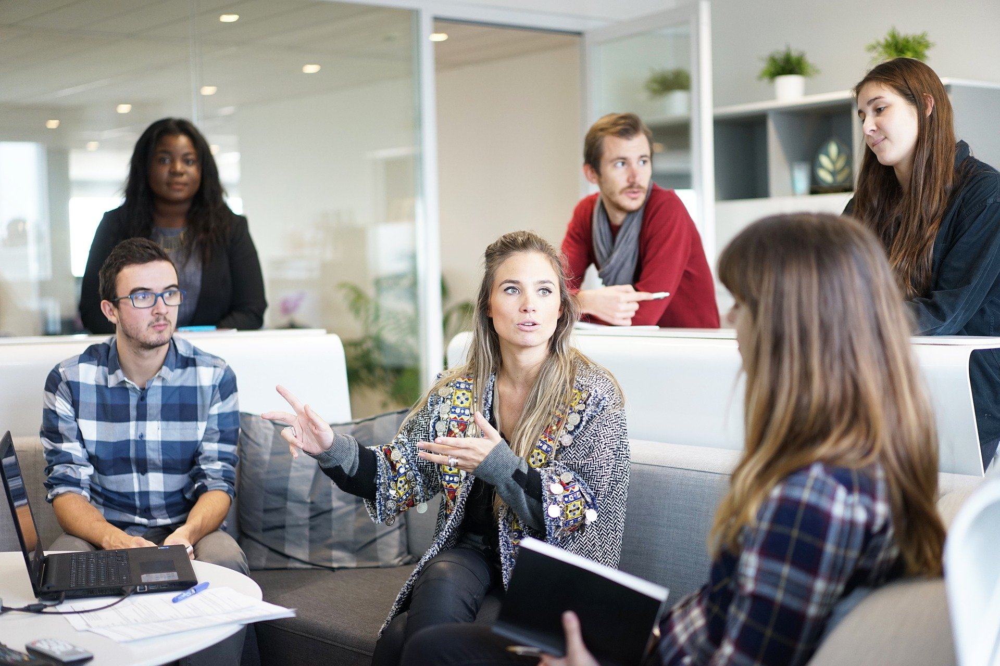

In [3]:
from google.colab.patches import cv2_imshow

cv2_imshow(image)
#cv2.imshow(image)

In [4]:
image = cv2.imread('people1.jpg')
image = cv2.resize(image, (int(image.shape[1]/2), int(image.shape[0]/2)))
image.shape

(640, 960, 3)

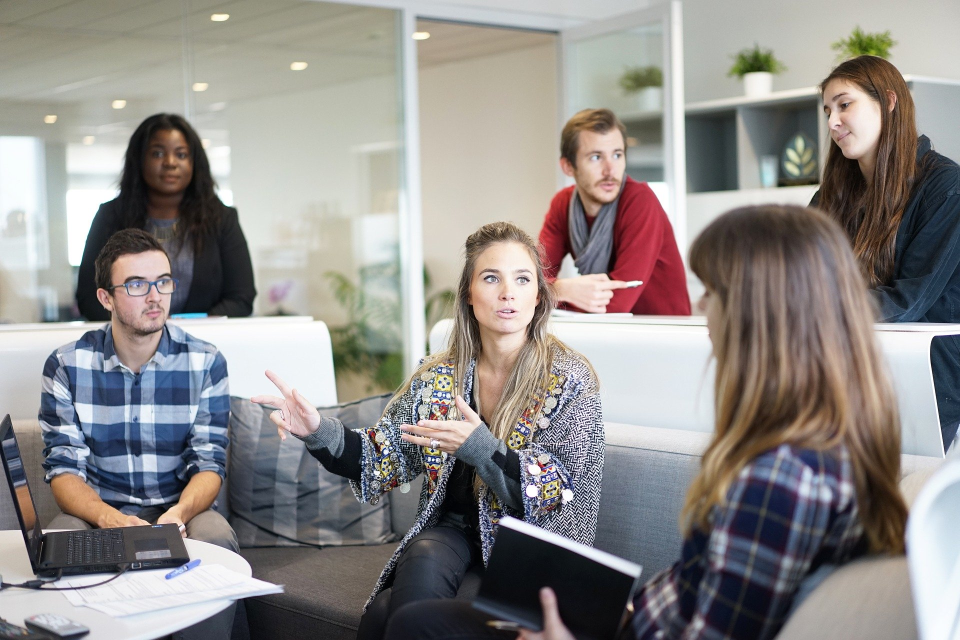

In [5]:
cv2_imshow(image)

In [6]:
pixel_counts = image.shape[0]*image.shape[1]*3
print(f'컬러 이미지의 픽셀수 : {pixel_counts: ,}')

컬러 이미지의 픽셀수 :  1,843,200


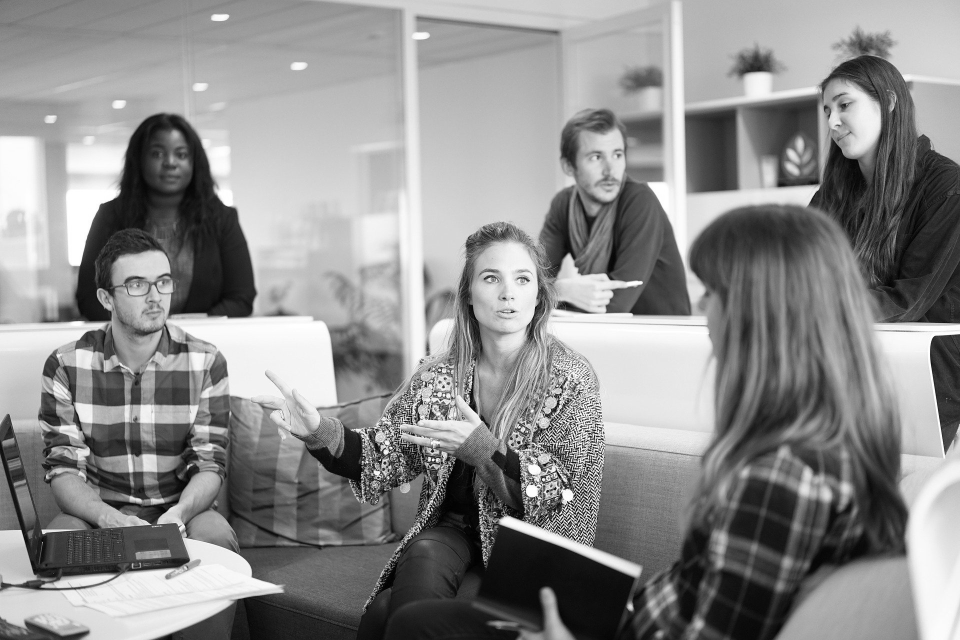

In [7]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

In [8]:
image.shape

(640, 960, 3)

In [9]:
gray_image.shape

(640, 960)

In [10]:
pixel_counts = gray_image.shape[0] * gray_image.shape[1]
print(f'그레이 이미지의 픽셀수 : {pixel_counts: ,}')

그레이 이미지의 픽셀수 :  614,400


## 1. Haar Cascade 사용
- 원하는 대상을 검출하기 위해 Haar알고리즘으로 미리 학습된 xml파일을 다운로드
- https://github.com/opencv/opencv/tree/master/data/haarcascades

In [12]:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/visionai/haarcascade/haarcascade_frontalface_default.xml')

In [13]:
detections = face_detector.detectMultiScale(gray_image)

In [14]:
detections

array([[141, 131,  58,  58],
       [817,  77,  74,  74],
       [573, 130,  66,  66],
       [465, 246,  85,  85],
       [114, 253,  73,  73]], dtype=int32)

In [15]:
len(detections)

5

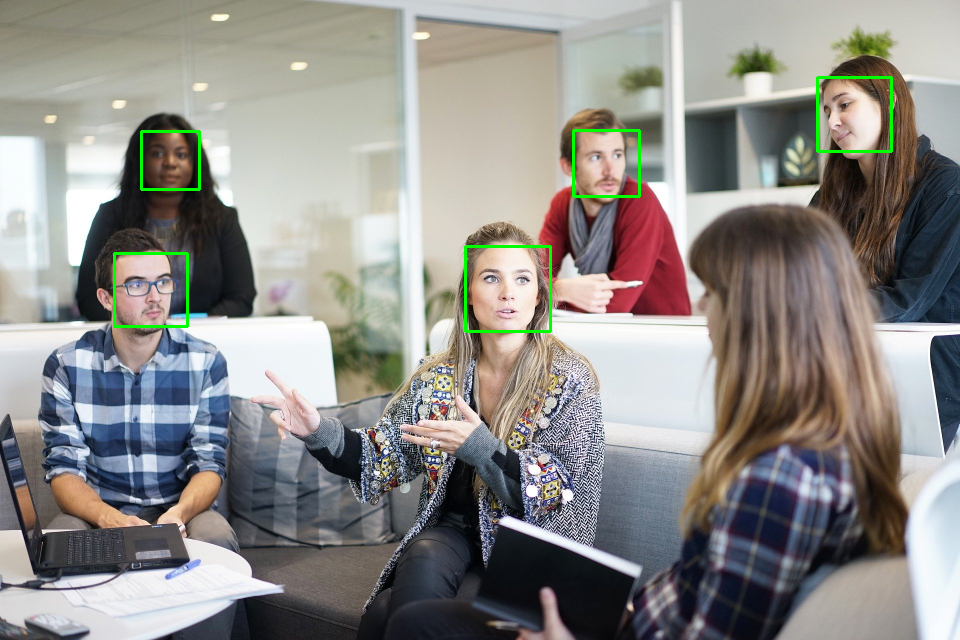

In [16]:
for (x, y, w, h) in detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)

cv2_imshow(image)

### Haarcascade 파라미터

140 131 59 59
816 77 75 75
574 131 65 65
465 245 85 85
450 199 106 106
114 253 74 74
464 336 77 77
700 425 93 93


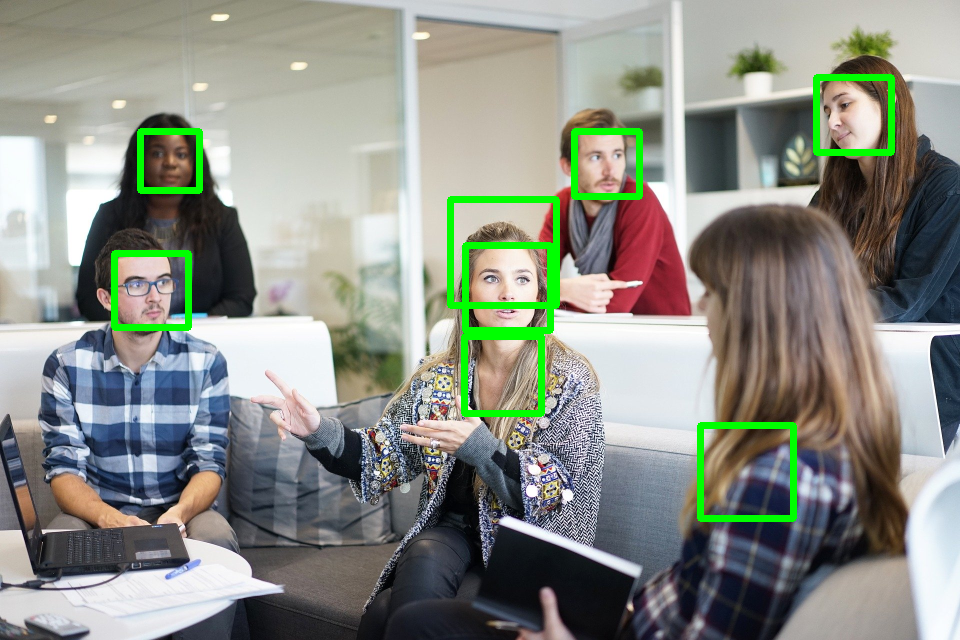

In [18]:
image = cv2.imread('people1.jpg')
image = cv2.resize(image, (int(image.shape[1]/2), int(image.shape[0]/2)))
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(gray_image, scaleFactor=1.09)

for (x, y, w, h) in detections:
    print(x, y, w, h)
    cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 5)

cv2_imshow(image)

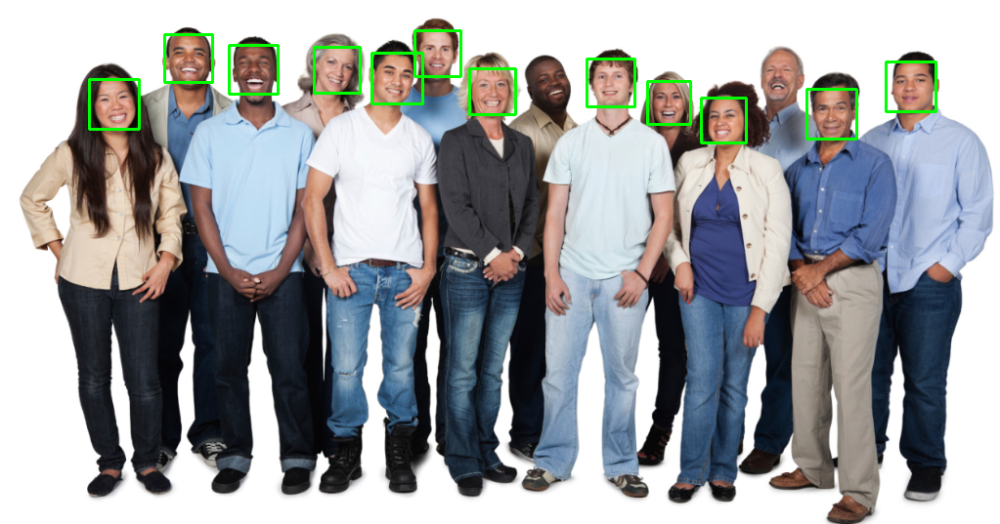

In [22]:
image = cv2.imread('people2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.2, minNeighbors=7,
                                            minSize=(20,20), maxSize=(100,100))
for (x, y, w, h) in detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)

cv2_imshow(image)

### 눈(Eye) 탐지

In [25]:
eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/visionai/haarcascade/haarcascade_eye.xml')

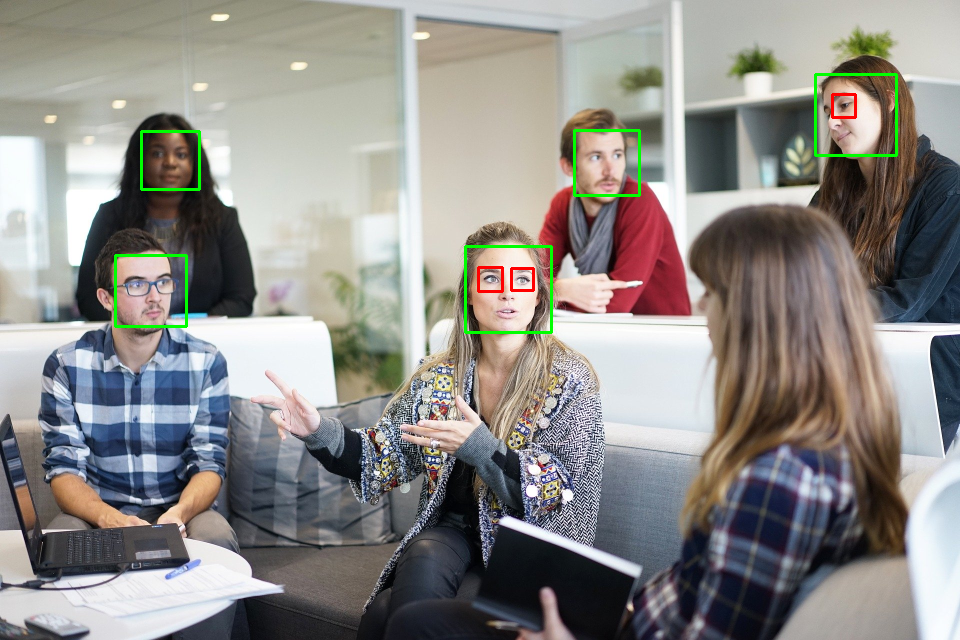

실행 시간: 0.7013 초


In [26]:
import time

start_time = time.time()

image = cv2.imread('people1.jpg')
image = cv2.resize(image, (int(image.shape[1]/2), int(image.shape[0]/2)))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

face_detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.3, minSize = (30,30))
for (x, y, w, h) in face_detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)

eye_detections = eye_detector.detectMultiScale(image_gray, scaleFactor = 1.1, minNeighbors=10, maxSize=(70,70))
for (x, y, w, h) in eye_detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0,0,255), 2)

cv2_imshow(image)

end_time = time.time()
execution_time = end_time - start_time

print(f"실행 시간: {execution_time:.4f} 초")

## 2. 얼굴탐지 : HOG 사용

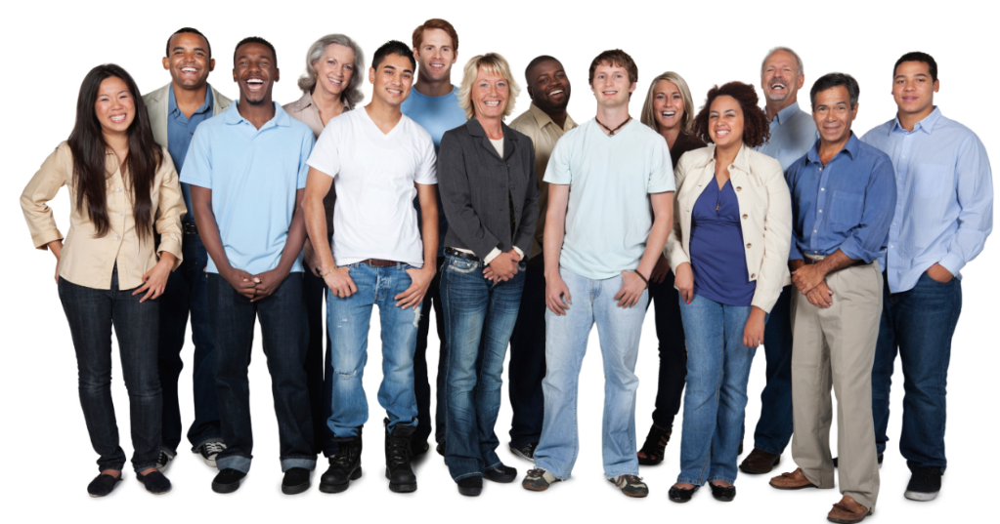

In [27]:
image = cv2.imread('people2.jpg')
cv2_imshow(image)

In [28]:
import dlib

face_detector_hog = dlib.get_frontal_face_detector()

In [29]:
detections = face_detector_hog(image, 1)

In [30]:
detections, len(detections)

(rectangles[[(429, 38) (465, 74)], [(665, 90) (701, 126)], [(717, 103) (760, 146)], [(909, 70) (952, 113)], [(828, 98) (871, 142)], [(605, 70) (641, 106)], [(777, 62) (813, 98)], [(485, 78) (521, 114)], [(386, 60) (429, 103)], [(170, 41) (213, 84)], [(93, 89) (136, 132)], [(237, 50) (280, 94)], [(323, 50) (367, 94)], [(544, 65) (588, 108)]],
 14)

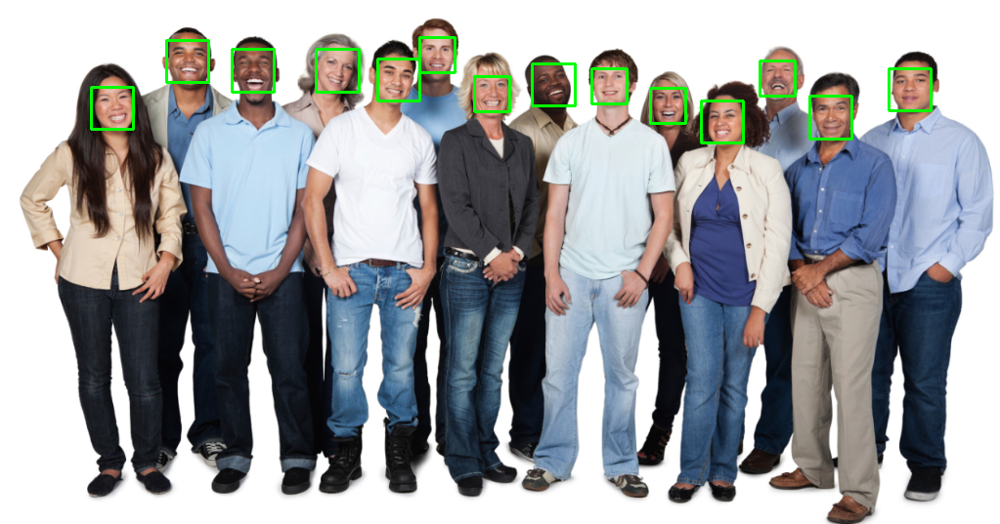

In [31]:
for face in detections:
    l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
    cv2.rectangle(image, (l, t), (r, b), (0, 255, 0), 2)

cv2_imshow(image)

### 얼굴 탐지 :  CNN(Convolutional Neural Networks) 사용

In [32]:
!wget https://raw.githubusercontent.com/kgpark88/visionai/main/mmod_human_face_detector.dat

--2023-10-24 13:35:15--  https://raw.githubusercontent.com/kgpark88/visionai/main/mmod_human_face_detector.dat
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 729940 (713K) [application/octet-stream]
Saving to: ‘mmod_human_face_detector.dat’

mmod_human_face_det 100%[===================>] 712.83K  --.-KB/s    in 0.05s   

2023-10-24 13:35:16 (13.4 MB/s) - ‘mmod_human_face_detector.dat’ saved [729940/729940]



In [33]:
image = cv2.imread('people2.jpg')
cnn_detector = dlib.cnn_face_detection_model_v1('mmod_human_face_detector.dat')

1.1440608501434326
1.1370506286621094
1.127898931503296
1.1200274229049683
1.1149379014968872
1.1131560802459717
1.0975687503814697
1.0942119359970093
1.0853146314620972
1.0801897048950195
1.0800751447677612
1.0784766674041748
1.0664023160934448
1.06417977809906


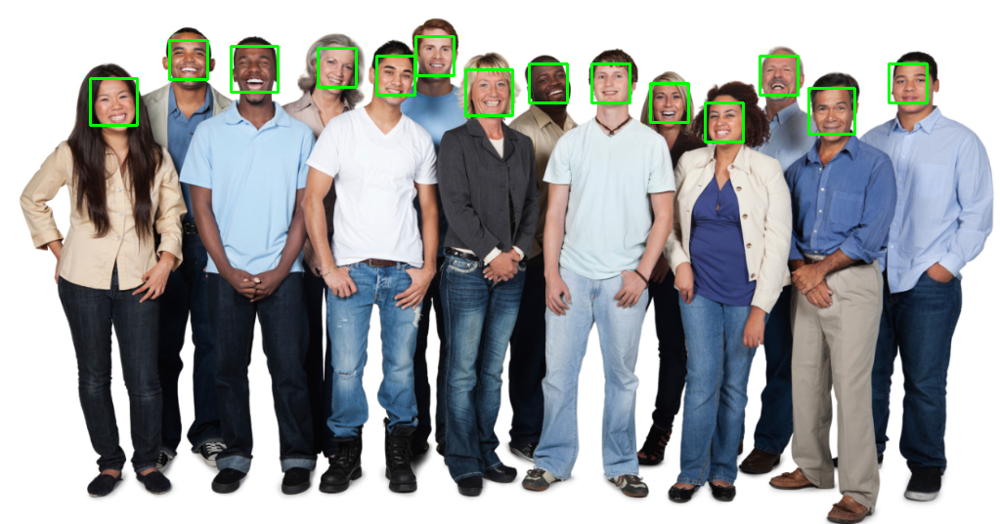

In [34]:
detections = cnn_detector(image, 1)
for face in detections:
    l, t, r, b, confidence = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
    print(confidence)
    cv2.rectangle(image, (l, t), (r, b), (0, 255, 0), 2)

cv2_imshow(image)

### 비교 :  Haar Cascade, HOG, CNN

#### Haar Cascade

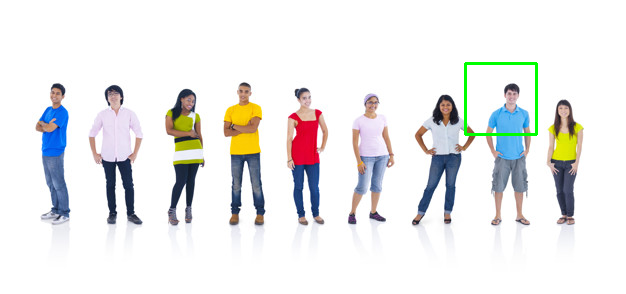

In [40]:
image = cv2.imread('people3.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
haarcascade_detector = cv2.CascadeClassifier('/content/drive/MyDrive/visionai/haarcascade/haarcascade_frontalface_default.xml')
detections = haarcascade_detector.detectMultiScale(image_gray, scaleFactor = 1.001, minNeighbors=5, minSize = (5,5))

for (x, y, w, h) in detections:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)

cv2_imshow(image)

#### HOG

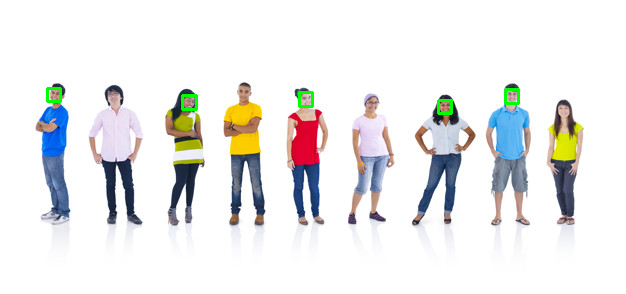

In [41]:
image = cv2.imread('people3.jpg')
face_detector_hog = dlib.get_frontal_face_detector()
detections = face_detector_hog(image, 4)

for face in detections:
    l, t, r, b = (face.left(), face.top(), face.right(), face.bottom())
    cv2.rectangle(image, (l, t), (r, b), (0, 255, 0), 2)

cv2_imshow(image)

#### CNN

0.44638633728027344
0.08115899562835693


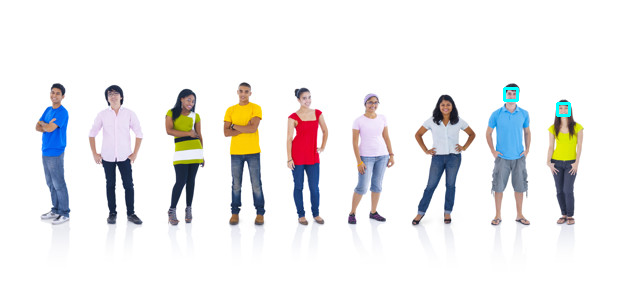

In [43]:
image = cv2.imread('people3.jpg')
cnn_detector = dlib.cnn_face_detection_model_v1('mmod_human_face_detector.dat')
detections = cnn_detector(image, 4)

for face in detections:
    l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
    print(c)
    cv2.rectangle(image, (l, t), (r, b), (255, 255, 0), 2)

cv2_imshow(image)